# Training the YOLOv8 Model (RGB / IR)

In [1]:
# missing yolo dep
!pip install lapx>=0.5.2

In [1]:
import cv2 as cv
from glob import glob
import matplotlib.pyplot as plt
import os
import random
from ultralytics import YOLO

## YOLOv8 Nano (RGB)

In [ ]:
# unzip downloaded dataset to `./datasets`
dataset_rgb = 'datasets/data_rgb.yaml'

# load a model
backbone_nano = YOLO("yolov8n.yaml")  # build a new model from scratch

### Model Training

In [4]:
import json
 
# Opening JSON file
f = open('./datasets/images_rgb_train/coco.json')
 
# returns JSON object as
# a dictionary
data = json.load(f)

In [5]:
# Iterating through the json
list = []
for i in data['annotations']:
    list.append(i['category_id'])

In [6]:
len(list)

169174

In [8]:
import numpy as np

print(np.unique(list))

# Closing file
f.close()

[ 0  1  2  3  5  6  8  9 12 13 14 15]


In [ ]:
# Train the model
results_n = backbone_nano.train(data=dataset_rgb, epochs=20)

> 20 epochs completed in 1.521 hours.

| Epoch | GPU_mem | box_loss | cls_loss | dfl_loss | Instances | Size |
| -- | -- | -- | -- | -- | -- | -- |
| 10/20 | 3.07G | 1.829 | 1.375 | 1.254 | 328 |
| Class | Images | Instances | P | R | mAP50 | mAP50-95 |
| all | 1085 | 16909 | 0.525 | 0.16 | 0.156 | 0.077 |

| Epoch | GPU_mem | box_loss | cls_loss | dfl_loss | Instances | Size |
| -- | -- | -- | -- | -- | -- | -- |
| 20/20 | 2.63G | 1.595 | 1.117 | 1.146 | 223 |
| Class | Images | Instances | P | R | mAP50 | mAP50-95 |
| all | 1085 | 16909 | 0.579 | 0.185 | 0.196 | 0.102 |


> YOLOv8n summary (fused): 168 layers, 3008768 parameters, 0 gradients

| Class | Images | Instances | P | R |  mAP50 | mAP50-95 |
| -- | -- | -- | -- | -- | -- | -- |
| all | 1085 | 16909 | 0.578 | 0.186 | 0.196 | 0.102 |
| person | 1085 | 3223 | 0.501 | 0.375 | 0.389 | 0.167 |
| bike | 1085 | 193 | 0.201 | 0.197 | 0.101 | 0.0438 |
| car | 1085 | 7285 | 0.662 | 0.575 | 0.621 | 0.397 |
| motor | 1085 | 77 | 0.418 | 0.26 | 0.298 | 0.164 |
| train | 1085 | 183 | 0.458 | 0.246 | 0.253 | 0.153 |
| truck | 1085 | 2190 | 0.458 | 0.198 | 0.206 | 0.0686 |
| hydrant | 1085 | 126 | 0.744 | 0.0232 | 0.0797 | 0.0265 |
| sign | 1085 | 3581 | 0.564 | 0.143 | 0.171 | 0.0824 |
| skateboard | 1085 | 4 | 1 | 0 | 0 | 0 |
| stroller | 1085 | 7 | 1 | 0 | 0.018 | 0.0144 |
| other vehicle | 1085 | 40 | 0.348 | 0.025 | 0.0231 | 0.00793 |


> _Speed: 0.2ms preprocess, 4.2ms inference, 0.0ms loss, 0.6ms postprocess per image_

![Training the YOLOv8 Model (RGB)](./assets/backbone_rgb_nano_results.webp)

(-0.5, 1919.5, 1647.5, -0.5)

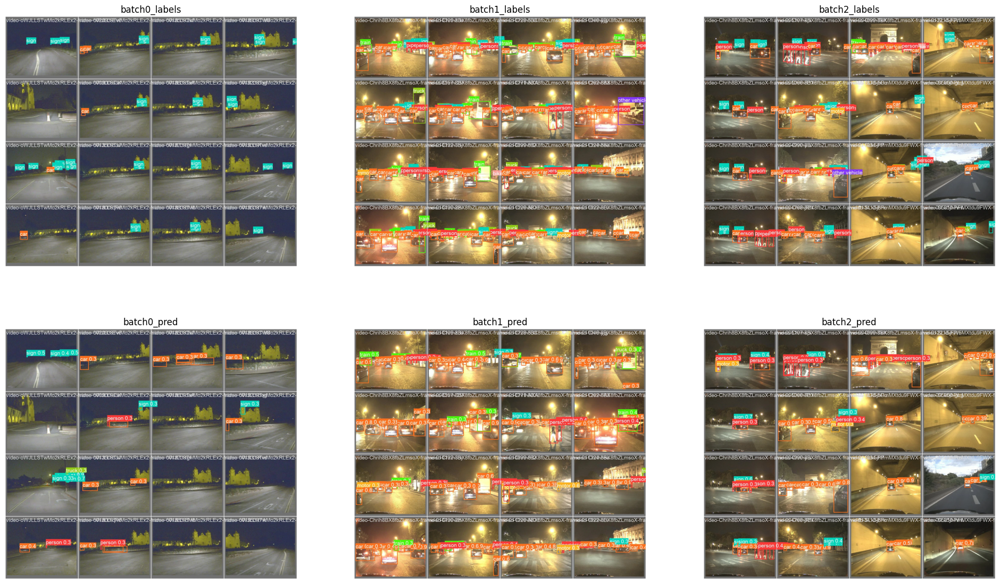

In [9]:
plt.figure(figsize=(24, 14))

im_batch0_labels = plt.imread('./assets/backbone_rgb_nano_val_batch0_labels.webp')
im_batch0_pred = plt.imread('./assets/backbone_rgb_nano_val_batch0_pred.webp')
im_batch1_labels = plt.imread('./assets/backbone_rgb_nano_val_batch1_labels.webp')
im_batch1_pred = plt.imread('./assets/backbone_rgb_nano_val_batch1_pred.webp')
im_batch2_labels = plt.imread('./assets/backbone_rgb_nano_val_batch2_labels.webp')
im_batch2_pred = plt.imread('./assets/backbone_rgb_nano_val_batch2_pred.webp')

ax = plt.subplot(2, 3, 1)
plt.title('batch0_labels')
plt.imshow(im_batch0_labels)
plt.axis("off")

ax = plt.subplot(2, 3, 2)
plt.title('batch1_labels')
plt.imshow(im_batch1_labels)
plt.axis("off")

ax = plt.subplot(2, 3, 3)
plt.title('batch2_labels')
plt.imshow(im_batch2_labels)
plt.axis("off")

ax = plt.subplot(2, 3, 4)
plt.title('batch0_pred')
plt.imshow(im_batch0_pred)
plt.axis("off")

ax = plt.subplot(2, 3, 5)
plt.title('batch1_pred')
plt.imshow(im_batch1_pred)
plt.axis("off")

ax = plt.subplot(2, 3, 6)
plt.title('batch2_pred')
plt.imshow(im_batch2_pred)
plt.axis("off")

### Model Evaluation

In [ ]:
# Evaluate the model's performance on the validation set
results_n = backbone_nano.val()

| Class | Images | Instances | P | R |  mAP50 | mAP50-95 |
| -- | -- | -- | -- | -- | -- | -- |
| all | 1085 | 16909 | 0.578 | 0.185 | 0.198 | 0.104 |
| person | 1085 | 3223 | 0.505 | 0.375 | 0.391 | 0.167 |
| bike | 1085 | 193 | 0.2 | 0.197 | 0.102 | 0.044 |
| car | 1085 | 7285 | 0.663 | 0.574 | 0.621 | 0.398 |
| motor | 1085 | 77 | 0.419 | 0.26 | 0.3 | 0.166 |
| train | 1085 | 183 | 0.455 | 0.246 | 0.252 | 0.155 |
| truck | 1085 | 2190 | 0.458 | 0.197 | 0.205 | 0.0686 |
| hydrant | 1085 | 126 | 0.741 | 0.023 | 0.0801 | 0.0274 |
| sign | 1085 | 3581 | 0.563 | 0.142 | 0.17 | 0.0824 |
| skateboard | 1085 | 4 | 1 | 0 | 0 | 0 |
| stroller | 1085 | 7 | 1 | 0 | 0.0353 | 0.023 |
| other vehicle | 1085 | 40 | 0.355 | 0.025 | 0.0231 | 0.00793 |

> _Speed: 0.3ms preprocess, 5.0ms inference, 0.0ms loss, 0.7ms postprocess per image_

![Training the YOLOv8 Model (RGB)](./assets/backbone_rgb_nano_confusion_matrix_normalized.webp)

In [ ]:
# Export the model to ONNX format
# success = backbone_nano.export(imgsz=(640, 480), format='onnx', opset=12, optimize=False, half=False)
# Export to PyTorch format
success = backbone_nano.export(imgsz=640, format='torchscript', optimize=False, half=False, int8=False)
# TorchScript: export success ✅ 1.3s, saved as 'runs/detect/train4/weights/best.torchscript' (11.9 MB)

In [ ]:
# pick pre-trained model
n_model = YOLO('runs/detect/train6/weights/best.torchscript')

In [ ]:
# read video by index
video = cv.VideoCapture(videos[1])
ret, frame = video.read()

# get video dims
frame_width = int(video.get(3))
frame_height = int(video.get(4))
size = (frame_width, frame_height)

# Define the codec and create VideoWriter object
fourcc = cv.VideoWriter_fourcc(*'DIVX')
out = cv.VideoWriter('./outputs/backbone_nano_rgb.avi', fourcc, 20.0, size)

# read frames
ret = True

while ret:
    ret, frame = video.read()

    if ret:
        # detect & track objects
        results = np_model.track(frame, persist=True)

        # plot results
        composed = results[0].plot()

        # save video
        out.write(composed)

out.release()
video.release()

## YOLOv8 Small (RGB)

In [ ]:
# unzip downloaded dataset to `./datasets`
dataset_rgb = 'datasets/data_rgb.yaml'

# load a model
backbone_small = YOLO("yolov8s.yaml")  # build a new model from scratch

### Model Training

In [ ]:
# Train the model
results_s = backbone_small.train(data=dataset_rgb, epochs=20)

> 20 epochs completed in 2.438 hours.

| Epoch | GPU_mem | box_loss | cls_loss | dfl_loss | Instances | Size |
| -- | -- | -- | -- | -- | -- | -- |
| 10/20 | 4.84G | 1.569 | 1.098 | 1.195 | 328 |
| Class | Images | Instances | P | R | mAP50 | mAP50-95 |
| all | 1085 | 16909 | 0.596 | 0.211 | 0.245 | 0.128 |

| Epoch | GPU_mem | box_loss | cls_loss | dfl_loss | Instances | Size |
| -- | -- | -- | -- | -- | -- | -- |
| 20/20 | 4.67G | 1.367 | 0.8879 | 1.083 | 223 |
| Class | Images | Instances | P | R | mAP50 | mAP50-95 |
| all | 1085 | 16909 | 0.608 | 0.25 | 0.291 | 0.158 |




> YOLOv8s summary (fused): 168 layers, 11131776 parameters, 0 gradients

| Class | Images | Instances | P | R |  mAP50 | mAP50-95 |
| -- | -- | -- | -- | -- | -- | -- |
| all | 1085 | 16909 | 0.523 | 0.255 | 0.291 | 0.159 |
| person | 1085 | 3223 | 0.618 | 0.428 | 0.481 | 0.225 |
| bike | 1085 | 193 | 0.248 | 0.326 | 0.239 | 0.121 |
| car | 1085 | 7285 | 0.718 | 0.63 | 0.683 | 0.454 |
| motor | 1085 | 77 | 0.566 | 0.338 | 0.382 | 0.22 |
| train | 1085 | 183 | 0.577 | 0.344 | 0.409 | 0.276 |
| truck | 1085 | 2190 | 0.593 | 0.318 | 0.336 | 0.119 |
| hydrant | 1085 | 126 | 0.8 | 0.175 | 0.293 | 0.129 |
| sign | 1085 | 3581 | 0.632 | 0.243 | 0.291 | 0.149 |
| skateboard | 1085 | 4 | 0 | 0 | 0 | 0 |
| stroller | 1085 | 7 | 1 | 0 | 0.0687 | 0.0477 |
| other vehicle | 1085 | 40 | 0 | 0 | 0.0135 | 0.00526 |

> _Speed: 0.3ms preprocess, 9.6ms inference, 0.0ms loss, 0.5ms postprocess per image_

![Training the YOLOv8 Model (RGB)](./assets/backbone_rgb_small_results.webp)

(-0.5, 1919.5, 1647.5, -0.5)

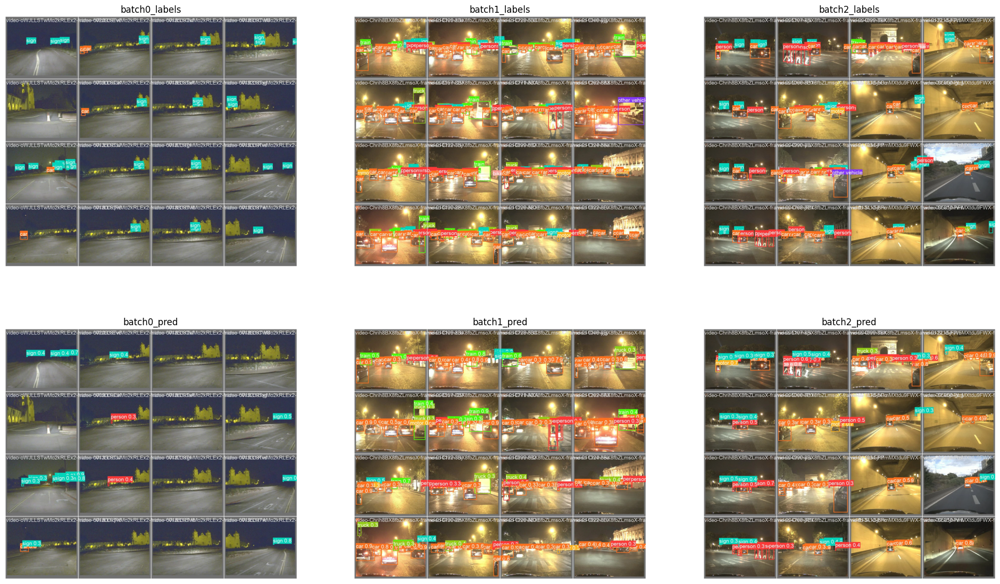

In [10]:
plt.figure(figsize=(24, 14))

im_batch0_labels = plt.imread('./assets/backbone_rgb_small_val_batch0_labels.webp')
im_batch0_pred = plt.imread('./assets/backbone_rgb_small_val_batch0_pred.webp')
im_batch1_labels = plt.imread('./assets/backbone_rgb_small_val_batch1_labels.webp')
im_batch1_pred = plt.imread('./assets/backbone_rgb_small_val_batch1_pred.webp')
im_batch2_labels = plt.imread('./assets/backbone_rgb_small_val_batch2_labels.webp')
im_batch2_pred = plt.imread('./assets/backbone_rgb_small_val_batch2_pred.webp')

ax = plt.subplot(2, 3, 1)
plt.title('batch0_labels')
plt.imshow(im_batch0_labels)
plt.axis("off")

ax = plt.subplot(2, 3, 2)
plt.title('batch1_labels')
plt.imshow(im_batch1_labels)
plt.axis("off")

ax = plt.subplot(2, 3, 3)
plt.title('batch2_labels')
plt.imshow(im_batch2_labels)
plt.axis("off")

ax = plt.subplot(2, 3, 4)
plt.title('batch0_pred')
plt.imshow(im_batch0_pred)
plt.axis("off")

ax = plt.subplot(2, 3, 5)
plt.title('batch1_pred')
plt.imshow(im_batch1_pred)
plt.axis("off")

ax = plt.subplot(2, 3, 6)
plt.title('batch2_pred')
plt.imshow(im_batch2_pred)
plt.axis("off")

### Model Evaluation

In [ ]:
# Evaluate the model's performance on the validation set
results_s = backbone_small.val()

| Class | Images | Instances | P | R |  mAP50 | mAP50-95 |
| -- | -- | -- | -- | -- | -- | -- |
| all | 1085 | 16909 | 0.524 | 0.253 | 0.29 | 0.159 |
| person | 1085 | 3223 | 0.622 | 0.428 | 0.481 | 0.225 |
| bike | 1085 | 193 | 0.247 | 0.321 | 0.239 | 0.121 |
| car | 1085 | 7285 | 0.722 | 0.629 | 0.683 | 0.454 |
| motor | 1085 | 77 | 0.563 | 0.338 | 0.382 | 0.219 |
| train | 1085 | 183 | 0.575 | 0.339 | 0.41 | 0.276 |
| truck | 1085 | 2190 | 0.6 | 0.315 | 0.333 | 0.12 |
| hydrant | 1085 | 126 | 0.8 | 0.175 | 0.292 | 0.129 |
| sign | 1085 | 3581 | 0.635 | 0.243 | 0.292 | 0.149 |
| skateboard | 1085 | 4 | 0 | 0 | 0 | 0 |
| stroller | 1085 | 7 | 1 | 0 | 0.069 | 0.0479 |
| other vehicle | 1085 | 40 | 0 | 0 | 0.0136 | 0.00526 |

> _Speed: 0.4ms preprocess, 10.9ms inference, 0.0ms loss, 0.6ms postprocess per image_

![Training the YOLOv8 Model (RGB)](./assets/backbone_rgb_small_confusion_matrix_normalized.webp)

In [ ]:
# Export the model to ONNX format
# success = backbone_nano.export(imgsz=(640, 480), format='onnx', opset=12, optimize=False, half=False)
# Export to PyTorch format
success = backbone_small.export(imgsz=640, format='torchscript', optimize=False, half=False, int8=False)
TorchScript: export success ✅ 2.1s, saved as 'runs/detect/train5/weights/best.torchscript' (42.9 MB)

## YOLOv8 Nano (IR)

In [ ]:
# unzip downloaded dataset to `./datasets`
dataset_ir = 'datasets/data_thermal.yaml'

# load a model
backbone_ir_nano = YOLO("yolov8n.yaml")  # build a new model from scratch

### Model Training

In [ ]:
# Train the model
results_ir_n = backbone_ir_nano.train(data=dataset_ir, epochs=20)

> 20 epochs completed in 1.337 hours.

| Epoch | GPU_mem | box_loss | cls_loss | dfl_loss | Instances | Size |
| -- | -- | -- | -- | -- | -- | -- |
| 10/20 | 3.33G | 1.746 | 1.263 | 1.211 | 104 |
| Class | Images | Instances | P | R | mAP50 | mAP50-95 |
| all | 1144 | 16688 | 0.466 | 0.186 | 0.226 | 0.112 |

| Epoch | GPU_mem | box_loss | cls_loss | dfl_loss | Instances | Size |
| -- | -- | -- | -- | -- | -- | -- |
| 20/20 | 2.5G | 1.518 | 1.016 | 1.111 | 102 |
| Class | Images | Instances | P | R | mAP50 | mAP50-95 |
| all | 1144 | 16688 | 0.513 | 0.249 | 0.276 | 0.146 |




> YOLOv8n summary (fused): 168 layers, 3008768 parameters, 0 gradients

| Class | Images | Instances | P | R |  mAP50 | mAP50-95 |
| -- | -- | -- | -- | -- | -- | -- |
| all | 1144 | 16688 | 0.514 | 0.249 | 0.276 | 0.146 |
| person | 1144 | 4470 | 0.628 | 0.555 | 0.594 | 0.276 |
| bike | 1144 | 170 | 0.278 | 0.25 | 0.219 | 0.11 |
| car | 1144 | 7128 | 0.691 | 0.65 | 0.71 | 0.449 |
| motor | 1144 | 55 | 0.569 | 0.364 | 0.39 | 0.19 |
| train | 1144 | 179 | 0.741 | 0.383 | 0.455 | 0.284 |
| truck | 1144 | 2048 | 0.467 | 0.259 | 0.274 | 0.105 |
| hydrant | 1144 | 94 | 0.678 | 0.0638 | 0.12 | 0.0535 |
| sign | 1144 | 2472 | 0.557 | 0.2 | 0.255 | 0.132 |
| skateboard | 1144 | 3 | 0 | 0 | 0 | 0 |
| stroller | 1144 | 6 | 1 | 0 | 0 | 0 |
| other vehicle | 1144 | 63 | 0.0423 | 0.0159 | 0.0194 | 0.00652 |

> _Speed: 0.3ms preprocess, 3.8ms inference, 0.0ms loss, 0.6ms postprocess per image_

![Training the YOLOv8 Model (RGB)](./assets/backbone_ir_nano_results.webp)

(-0.5, 1919.5, 1555.5, -0.5)

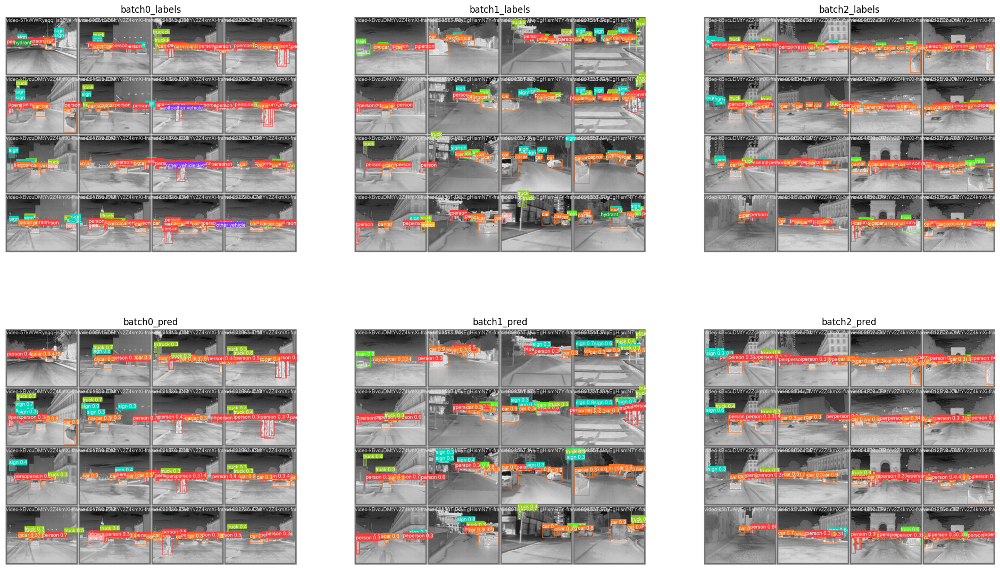

In [2]:
plt.figure(figsize=(24, 14))

im_batch0_labels = plt.imread('./assets/backbone_ir_nano_val_batch0_labels.webp')
im_batch0_pred = plt.imread('./assets/backbone_ir_nano_val_batch0_pred.webp')
im_batch1_labels = plt.imread('./assets/backbone_ir_nano_val_batch1_labels.webp')
im_batch1_pred = plt.imread('./assets/backbone_ir_nano_val_batch1_pred.webp')
im_batch2_labels = plt.imread('./assets/backbone_ir_nano_val_batch2_labels.webp')
im_batch2_pred = plt.imread('./assets/backbone_ir_nano_val_batch2_pred.webp')

ax = plt.subplot(2, 3, 1)
plt.title('batch0_labels')
plt.imshow(im_batch0_labels)
plt.axis("off")

ax = plt.subplot(2, 3, 2)
plt.title('batch1_labels')
plt.imshow(im_batch1_labels)
plt.axis("off")

ax = plt.subplot(2, 3, 3)
plt.title('batch2_labels')
plt.imshow(im_batch2_labels)
plt.axis("off")

ax = plt.subplot(2, 3, 4)
plt.title('batch0_pred')
plt.imshow(im_batch0_pred)
plt.axis("off")

ax = plt.subplot(2, 3, 5)
plt.title('batch1_pred')
plt.imshow(im_batch1_pred)
plt.axis("off")

ax = plt.subplot(2, 3, 6)
plt.title('batch2_pred')
plt.imshow(im_batch2_pred)
plt.axis("off")

### Model Evaluation

In [ ]:
# Evaluate the model's performance on the validation set
results_ir_n = backbone_ir_nano.val()

| Class | Images | Instances | P | R |  mAP50 | mAP50-95 |
| -- | -- | -- | -- | -- | -- | -- |
| all | 1144 | 16688 | 0.516 | 0.249 | 0.276 | 0.146 |
| person | 1144 | 4470 | 0.631 | 0.556 | 0.595 | 0.276 |
| bike | 1144 | 170 | 0.288 | 0.253 | 0.222 | 0.111 |
| car | 1144 | 7128 | 0.696 | 0.65 | 0.711 | 0.449 |
| motor | 1144 | 55 | 0.57 | 0.364 | 0.39 | 0.189 |
| train | 1144 | 179 | 0.746 | 0.378 | 0.455 | 0.283 |
| truck | 1144 | 2048 | 0.462 | 0.256 | 0.271 | 0.104 |
| hydrant | 1144 | 94 | 0.679 | 0.0638 | 0.12 | 0.0526 |
| sign | 1144 | 2472 | 0.557 | 0.199 | 0.256 | 0.132 |
| skateboard | 1144 | 3 | 0 | 0 | 0 | 0 |
| stroller | 1144 | 6 | 1 | 0 | 0 | 0 |
| other vehicle | 1144 | 63 | 0.0425 | 0.0159 | 0.0193 | 0.00637 |

> _Speed: 0.3ms preprocess, 4.5ms inference, 0.0ms loss, 0.7ms postprocess per image_

![Training the YOLOv8 Model (RGB)](./assets/backbone_ir_nano_confusion_matrix_normalized.webp)

In [ ]:
# Export the model to ONNX format
# success = backbone_nano.export(imgsz=(640, 480), format='onnx', opset=12, optimize=False, half=False)
# Export to PyTorch format
success = backbone_ir_nano.export(imgsz=640, format='torchscript', optimize=False, half=False, int8=False)
# TorchScript: export success ✅ 1.6s, saved as 'runs/detect/train6/weights/best.torchscript' (12.4 MB)

## YOLOv8 Small (IR)

In [ ]:
# unzip downloaded dataset to `./datasets`
dataset_ir = 'datasets/data_thermal.yaml'

# load a model
backbone_ir_small = YOLO("yolov8s.yaml")  # build a new model from scratch

### Model Training

In [ ]:
# Train the model
results_ir_s = backbone_ir_small.train(data=dataset_ir, epochs=20)

> 20 epochs completed in 2.827 hours.

| Epoch | GPU_mem | box_loss | cls_loss | dfl_loss | Instances | Size |
| -- | -- | -- | -- | -- | -- | -- |
| 10/20 | 4.83G | 1.508 | 1.018 | 1.16 | 104 |
| Class | Images | Instances | P | R | mAP50 | mAP50-95 |
| all | 1144 | 16688 | 0.489 | 0.286 | 0.313 | 0.168 |

| Epoch | GPU_mem | box_loss | cls_loss | dfl_loss | Instances | Size |
| -- | -- | -- | -- | -- | -- | -- |
| 20/20 | 4.67G | 1.317 | 0.8207 | 1.064 | 102 |
| Class | Images | Instances | P | R | mAP50 | mAP50-95 |
| all | 1144 | 16688 | 0.554 | 0.322 | 0.358 | 0.2 |




> YOLOv8s summary (fused): 168 layers, 11131776 parameters, 0 gradients

| Class | Images | Instances | P | R | mAP50 | mAP50-95 |
| -- | -- | -- | -- | -- | -- | -- |
| all | 1144 | 16688 | 0.554 | 0.322 | 0.358 | 0.2 |
| person | 1144 | 4470 | 0.687 | 0.634 | 0.688 | 0.355 |
| bike | 1144 | 170 | 0.364 | 0.347 | 0.308 | 0.174 |
| car | 1144 | 7128 | 0.74 | 0.725 | 0.781 | 0.527 |
| motor | 1144 | 55 | 0.608 | 0.509 | 0.552 | 0.25 |
| train | 1144 | 179 | 0.683 | 0.419 | 0.526 | 0.358 |
| truck | 1144 | 2048 | 0.601 | 0.385 | 0.415 | 0.178 |
| hydrant | 1144 | 94 | 0.687 | 0.149 | 0.274 | 0.147 |
| sign | 1144 | 2472 | 0.608 | 0.313 | 0.362 | 0.195 |
| skateboard | 1144 | 3 | 0 | 0 | 0 | 0 |
| stroller | 1144 | 6 | 1 | 0 | 0 | 0 |
| other vehicle | 1144 | 63 | 0.112 | 0.0635 | 0.0254 | 0.0151 |

> _Speed: 0.3ms preprocess, 9.6ms inference, 0.0ms loss, 0.6ms postprocess per image_

![Training the YOLOv8 Model (RGB)](./assets/backbone_ir_small_results.webp)

(-0.5, 1919.5, 1555.5, -0.5)

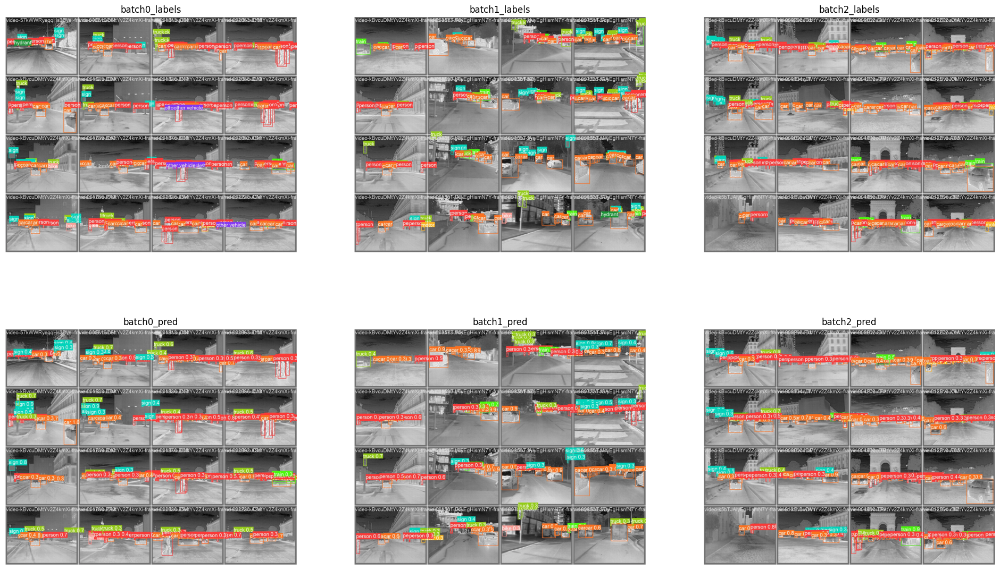

In [3]:
plt.figure(figsize=(24, 14))

im_batch0_labels = plt.imread('./assets/backbone_ir_small_val_batch0_labels.webp')
im_batch0_pred = plt.imread('./assets/backbone_ir_small_val_batch0_pred.webp')
im_batch1_labels = plt.imread('./assets/backbone_ir_small_val_batch1_labels.webp')
im_batch1_pred = plt.imread('./assets/backbone_ir_small_val_batch1_pred.webp')
im_batch2_labels = plt.imread('./assets/backbone_ir_small_val_batch2_labels.webp')
im_batch2_pred = plt.imread('./assets/backbone_ir_small_val_batch2_pred.webp')

ax = plt.subplot(2, 3, 1)
plt.title('batch0_labels')
plt.imshow(im_batch0_labels)
plt.axis("off")

ax = plt.subplot(2, 3, 2)
plt.title('batch1_labels')
plt.imshow(im_batch1_labels)
plt.axis("off")

ax = plt.subplot(2, 3, 3)
plt.title('batch2_labels')
plt.imshow(im_batch2_labels)
plt.axis("off")

ax = plt.subplot(2, 3, 4)
plt.title('batch0_pred')
plt.imshow(im_batch0_pred)
plt.axis("off")

ax = plt.subplot(2, 3, 5)
plt.title('batch1_pred')
plt.imshow(im_batch1_pred)
plt.axis("off")

ax = plt.subplot(2, 3, 6)
plt.title('batch2_pred')
plt.imshow(im_batch2_pred)
plt.axis("off")

### Model Evaluation

In [ ]:
# Evaluate the model's performance on the validation set
results_ir_s = backbone_ir_small.val()

| Class | Images | Instances | P | R | mAP50 | mAP50-95 |
| -- | -- | -- | -- | -- | -- | -- |
| all | 1144 | 16688 | 0.555 | 0.322 | 0.358 | 0.2 |
| person | 1144 | 4470 | 0.691 | 0.632 | 0.687 | 0.356 |
| bike | 1144 | 170 | 0.369 | 0.353 | 0.309 | 0.174 |
| car | 1144 | 7128 | 0.743 | 0.725 | 0.781 | 0.527 |
| motor | 1144 | 55 | 0.593 | 0.504 | 0.551 | 0.251 |
| train | 1144 | 179 | 0.683 | 0.419 | 0.527 | 0.361 |
| truck | 1144 | 2048 | 0.608 | 0.386 | 0.418 | 0.178 |
| hydrant | 1144 | 94 | 0.695 | 0.149 | 0.274 | 0.148 |
| sign | 1144 | 2472 | 0.614 | 0.313 | 0.362 | 0.195 |
| skateboard | 1144 | 3 | 0 | 0 | 0 | 0 |
| stroller | 1144 | 6 | 1 | 0 | 0 | 0 |
| other vehicle | 1144 | 63 | 0.112 | 0.0635 | 0.0254 | 0.0151 |

![Training the YOLOv8 Model (RGB)](./assets/backbone_ir_small_confusion_matrix_normalized.webp)

In [ ]:
# Export the model to ONNX format
# success = backbone_nano.export(imgsz=(640, 480), format='onnx', opset=12, optimize=False, half=False)
# Export to PyTorch format
success = backbone_ir_small.export(imgsz=640, format='torchscript', optimize=False, half=False, int8=False)
# TorchScript: export success ✅ 1.6s, saved as 'runs/detect/train6/weights/best.torchscript' (12.4 MB)